In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, accuracy_score
import seaborn as sns

In [133]:
IMAGE_SIZE = (128, 128)
BATCH_SIZE = 32

all_real_dir = 'real_people'
celeb_real = 'celeba/img_align_celeba/img_align_celeba'
more_real_train = 'real_fake/real_vs_fake/real-vs-fake/train/real'
more_real_test = 'real_fake/real_vs_fake/real-vs-fake/test/real'
more_real_valid = 'real_fake/real_vs_fake/real-vs-fake/valid/real'
more_fake_train = 'real_fake/real_vs_fake/real-vs-fake/train/fake'
more_fake_test = 'real_fake/real_vs_fake/real-vs-fake/test/fake'
more_fake_valid = 'real_fake/real_vs_fake/real-vs-fake/valid/fake'
train_real_dir = 'Dataset/Train/Real'
train_fake_dir = 'Dataset/Train/Fake'
test_real_dir = 'Dataset/Test/Real'
validation_real_dir = 'Dataset/Validation/Real'
validation_fake_dir = 'Dataset/Validation/Fake'

test_fake_male_dir = 'ThisPersonDoesNotExist/male'
test_fake_female_dir = 'ThisPersonDoesNotExist/female'

def create_dataframe_from_directory(directory, label):
    image_files = [f for f in os.listdir(directory) if \
                   f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    image_paths = [os.path.join(directory, f) for f in image_files]
    df = pd.DataFrame({'path': image_paths, 'label': label})
    return df

all_real_df = pd.concat([
    create_dataframe_from_directory(train_real_dir, label='1'),
    create_dataframe_from_directory(more_real_train, label='1'),
    create_dataframe_from_directory(more_real_test, label='1'),
    create_dataframe_from_directory(more_real_valid, label='1'),
    create_dataframe_from_directory(validation_real_dir, label='1'),
    create_dataframe_from_directory(test_real_dir, label='1'),
    create_dataframe_from_directory(all_real_dir, label='1'),
    create_dataframe_from_directory(celeb_real, label='1')
], ignore_index=True)

all_fake_df = pd.concat([
    create_dataframe_from_directory(train_fake_dir, label='0'),
    create_dataframe_from_directory(more_fake_train, label='0'),
    create_dataframe_from_directory(more_fake_test, label='0'),
    create_dataframe_from_directory(more_fake_valid, label='0'),
    create_dataframe_from_directory(validation_fake_dir, label='0')
], ignore_index=True)

all_df = pd.concat([all_real_df, all_fake_df], ignore_index=True)

all_df.drop_duplicates(subset='path', inplace=True)
all_df = all_df.sample(frac=1, random_state=42).reset_index(drop=True)

train_df_temp, test_val_df_temp = train_test_split(all_df, test_size=0.4,
                                                   random_state=42,
                                                   stratify=all_df['label'])

val_df_temp, test_df_temp = train_test_split(test_val_df_temp,
                                             test_size=0.5,
                                             random_state=42,
                                             stratify=\
                                                test_val_df_temp['label'])

test_fake_male_df = create_dataframe_from_directory(test_fake_male_dir,
                                                    label='0')
test_fake_female_df = create_dataframe_from_directory(test_fake_female_dir,
                                                      label='0')
test_only_fake_df = pd.concat([test_fake_male_df, test_fake_female_df],
                              ignore_index=True)

test_df = pd.concat([test_df_temp, test_only_fake_df],
                    ignore_index=True)

val_df = val_df_temp.copy()
train_df = train_df_temp.copy()

print("Training DataFrame:")
print(train_df.head())

print("\nTraining DataFrame:")
print(train_df['label'].value_counts())

print("\nValidation DataFrame:")
print(val_df['label'].value_counts())

print("\nTest DataFrame:")
print(test_df['label'].value_counts())

print("\nLen Training DataFrame:", len(train_df))
print("Len Val DataFrame:", len(val_df))
print("Len Test DataFrame:", len(test_df))


Training DataFrame:
                                                     path label
487269  real_fake/real_vs_fake/real-vs-fake/train/real...     1
275602                  Dataset/Train/Real/real_19594.jpg     1
148909                  Dataset/Train/Fake/fake_51737.jpg     0
522469  celeba/img_align_celeba/img_align_celeba/13634...     1
306242                   Dataset/Train/Fake/fake_8040.jpg     0

Training DataFrame:
1    221705
0     92960
Name: label, dtype: int64

Validation DataFrame:
1    73903
0    30986
Name: label, dtype: int64

Test DataFrame:
1    73902
0    37860
Name: label, dtype: int64

Len Training DataFrame: 314665
Len Val DataFrame: 104889
Len Test DataFrame: 111762


In [134]:
def verify_images(df):
    invalid = []
    for i, row in df.iterrows():
        path = row['path']
        try:
            with Image.open(path) as img:
                img.verify()
        except (IOError, SyntaxError):
            invalid.append((i))
    return invalid

invalid_train_images = verify_images(train_df)
invalid_val_images = verify_images(val_df)
invalid_test_images = verify_images(test_df)

In [135]:
def remove_invalid_images(df, invalid_images):
    index = [i for i in invalid_images]
    if index:
        df = df.drop(index).reset_index(drop=True)
        print(f"Removed {len(index)} invalid")
    else:
        print("No invalid")
    return df

train_df = remove_invalid_images(train_df, invalid_train_images)
validation_df = remove_invalid_images(val_df, invalid_val_images)
test_df = remove_invalid_images(test_df, invalid_test_images)

Removed 1 invalid
No invalid
No invalid


In [136]:
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='path',
    y_col='label',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary')

validation_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='path',
    y_col='label',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='path',
    y_col='label',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False)

Found 314664 validated image filenames belonging to 2 classes.
Found 104889 validated image filenames belonging to 2 classes.
Found 111762 validated image filenames belonging to 2 classes.


In [ ]:
model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=3,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE
)

test_loss, test_acc = model.evaluate(
    test_generator,
    steps=test_generator.samples // BATCH_SIZE
)
print('Test accuracy:', test_acc)

model.save('model_without_fake')

Epoch 1/3


2024-12-10 00:47:33.002408: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


9833/9833 [==============================] - ETA: 0s - loss: 0.2185 - accuracy: 0.9024

2024-12-10 00:58:03.330523: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


9833/9833 [==============================] - 807s 82ms/step - loss: 0.2185 - accuracy: 0.9024 - val_loss: 0.1484 - val_accuracy: 0.9391
Epoch 2/3
9833/9833 [==============================] - 815s 83ms/step - loss: 0.1144 - accuracy: 0.9544 - val_loss: 0.1033 - val_accuracy: 0.9593
Epoch 3/3
3492/3492 [==============================] - 338s 97ms/step - loss: 0.1993 - accuracy: 0.9293
Test accuracy: 0.9293205738067627


INFO:tensorflow:Assets written to: model_without_fake/assets


INFO:tensorflow:Assets written to: model_without_fake/assets


In [93]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 128)      0

1/1 [==============================] - 0s 11ms/step


2024-12-10 08:38:29.121039: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 11ms/step


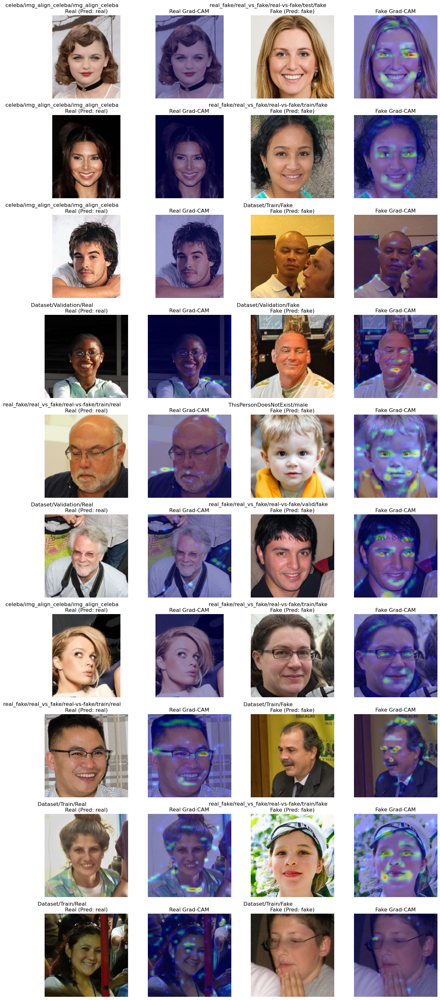

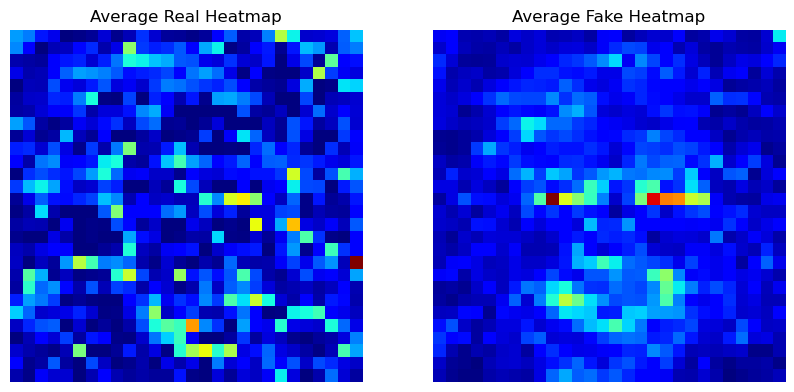

In [151]:
def preprocess_image(img_path, target_size=IMAGE_SIZE):
    img = Image.open(img_path).convert('RGB').resize(target_size)
    x = np.array(img, dtype=np.float32) / 255.0
    return np.expand_dims(x, axis=0)

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=0):
    grad_model = Model([model.inputs], 
                       [model.get_layer(last_conv_layer_name).output,
                        model.output])

    with tf.GradientTape() as tape:
        outputs, predictions = grad_model(img_array)
        channel = predictions[:, pred_index]

    grads = tape.gradient(channel, outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    outputs = outputs[0]
    heatmap = tf.squeeze(outputs @ pooled_grads[..., tf.newaxis])
    return np.maximum(heatmap, 0) / (np.max(heatmap) + 1e-8)

def overlay_heatmap(img_path, heatmap, alpha=0.4):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    new_heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    jet_colors = plt.get_cmap("jet")(np.arange(256))[:, :3]
    jet_heatmap = (jet_colors[
        (new_heatmap * 255).astype(np.uint8)] * 255).astype(np.uint8)
    return img, cv2.addWeighted(img, 1 - alpha, jet_heatmap, alpha, 0)

def predict_class(img_path, model, threshold=0.5):
    array = preprocess_image(img_path)
    preds = model.predict(array)
    return int(preds[0][0] > threshold)

def is_correctly_classified(img_path, model, true_label):
    return predict_class(img_path, model) == true_label

def find_correctly_classified_image(label, model, test_df, max_attempts=200):
    candidates = test_df[test_df['label'] == str(label)]['path'].values
    np.random.shuffle(candidates)
    for i, candidate in enumerate(candidates):
        if i >= max_attempts:
            break
        if is_correctly_classified(candidate, model, label):
            return candidate
    return None

def average_heatmap(image_paths, model, last_conv_layer):
    heatmaps = [make_gradcam_heatmap(preprocess_image(p),
                                     model,
                                     last_conv_layer) for p in image_paths]
    return sum(heatmaps) / len(heatmaps)

def show_feature_differences(model, test_df, last_conv_layer_name, n_pairs=10):
    pairs = []
    label_names = {0: 'fake', 1: 'real'}
    all_real_paths, all_fake_paths = [], []

    for _ in range(n_pairs):
        real_img_path = find_correctly_classified_image(1, model, test_df)
        fake_img_path = find_correctly_classified_image(0, model, test_df)
        pairs.append((real_img_path, fake_img_path))

    _, axes = plt.subplots(len(pairs), 4, figsize=(16, 4 * len(pairs)))

    for i, (real_img_path, fake_img_path) in enumerate(pairs):
        real_heatmap = make_gradcam_heatmap(preprocess_image(real_img_path),
                                            model, last_conv_layer_name)
        fake_heatmap = make_gradcam_heatmap(preprocess_image(fake_img_path),
                                            model, last_conv_layer_name)

        real_original, real_cam = overlay_heatmap(real_img_path, real_heatmap)
        fake_original, fake_cam = overlay_heatmap(fake_img_path, fake_heatmap)

        real_pred_class = predict_class(real_img_path, model)
        fake_pred_class = predict_class(fake_img_path, model)

        axes[i, 0].imshow(real_original)
        axes[i, 0].set_title(f"{os.path.dirname(real_img_path)}\
                             \nReal (Pred: {label_names[real_pred_class]})")
        axes[i, 1].imshow(real_cam)
        axes[i, 1].set_title("Real Grad-CAM")

        axes[i, 2].imshow(fake_original)
        axes[i, 2].set_title(f"{os.path.dirname(fake_img_path)}\
                             \nFake (Pred: {label_names[fake_pred_class]})")
        axes[i, 3].imshow(fake_cam)
        axes[i, 3].set_title("Fake Grad-CAM")

        for ax in axes[i]:
            ax.axis('off')

        all_real_paths.append(real_img_path)
        all_fake_paths.append(fake_img_path)

    real_heatmap_avg = average_heatmap(all_real_paths,
                                       model,
                                       last_conv_layer=last_conv_layer_name)
    fake_heatmap_avg = average_heatmap(all_fake_paths,
                                       model,
                                       last_conv_layer=last_conv_layer_name)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Average Real Heatmap")
    plt.imshow(real_heatmap_avg, cmap='jet')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Average Fake Heatmap")
    plt.imshow(fake_heatmap_avg, cmap='jet')
    plt.axis('off')

    plt.show()

model = load_model("model_without_fake")
show_feature_differences(model, test_df, last_conv_layer_name='conv2d_2',
                         n_pairs=10)

In [154]:
n = 5000
real_sample = test_df[test_df['label'] == '1'].sample(n)['path'].values
fake_sample = test_df[test_df['label'] == '0'].sample(n)['path'].values
all_paths = np.concatenate([real_sample, fake_sample])

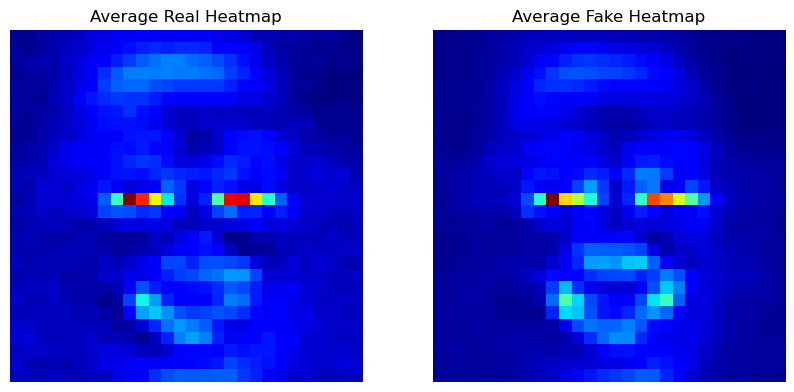

In [155]:
def average_heatmap(image_paths, model, last_conv_layer='conv2d_2'):
    sum_heatmap = None
    count = 0
    for p in image_paths:
        img_array = preprocess_image(p, target_size=IMAGE_SIZE)
        h = make_gradcam_heatmap(img_array, model, last_conv_layer)
        if sum_heatmap is None:
            sum_heatmap = h
        else:
            sum_heatmap += h
        count += 1
    return sum_heatmap / (count if count > 0 else 1)

real_heatmap_avg = average_heatmap(real_sample, model)
fake_heatmap_avg = average_heatmap(fake_sample, model)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.title("Average Real Heatmap"); \
    plt.imshow(real_heatmap_avg, cmap='jet'); plt.axis('off')
plt.subplot(1,2,2); plt.title("Average Fake Heatmap"); \
    plt.imshow(fake_heatmap_avg, cmap='jet'); plt.axis('off')
plt.show()


   1/3493 [..............................] - ETA: 14:07

2024-12-10 08:59:36.251230: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3493/3493 [==============================] - 343s 98ms/step
F1-score: 0.9471367701456197
Precision: 0.936518644919772
Recall: 0.9579984303537117
Accuracy: 0.9292872353751722


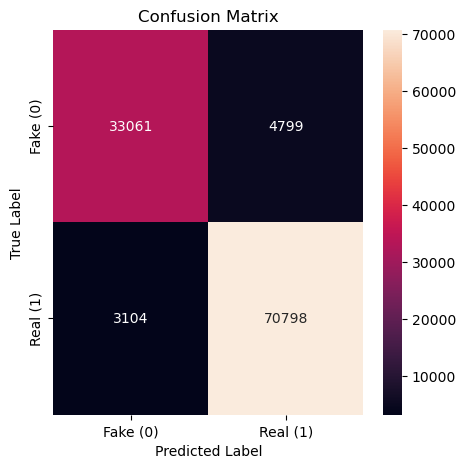

In [156]:
preds = model.predict(test_generator,
                      steps=test_generator.samples //\
                          test_generator.batch_size + 1, verbose=1)
y_pred = (preds > 0.5).astype(int).ravel()
y_true = test_generator.classes

cm = confusion_matrix(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
accuracy = accuracy_score(y_true, y_pred)

print("F1-score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)

plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=['Fake (0)', 'Real (1)'],
            yticklabels=['Fake (0)', 'Real (1)'])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


1/1 [==============================] - 0s 13ms/step


2024-12-10 09:05:20.081986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 10ms/step


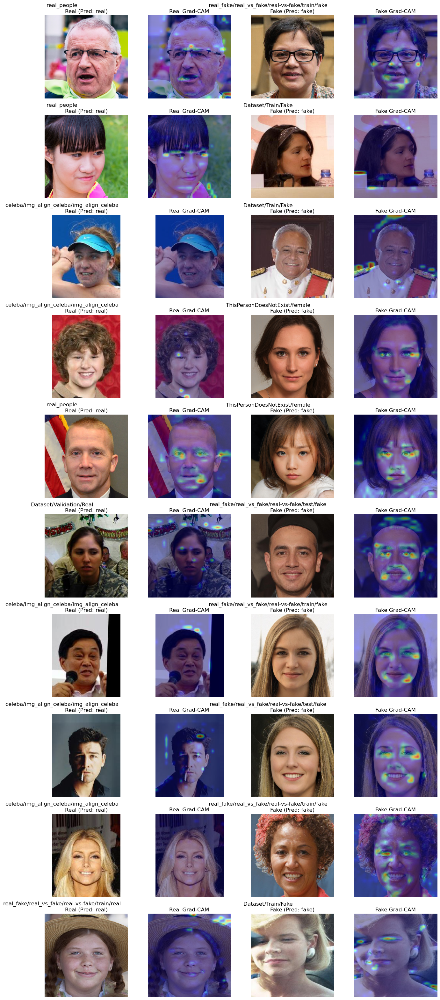

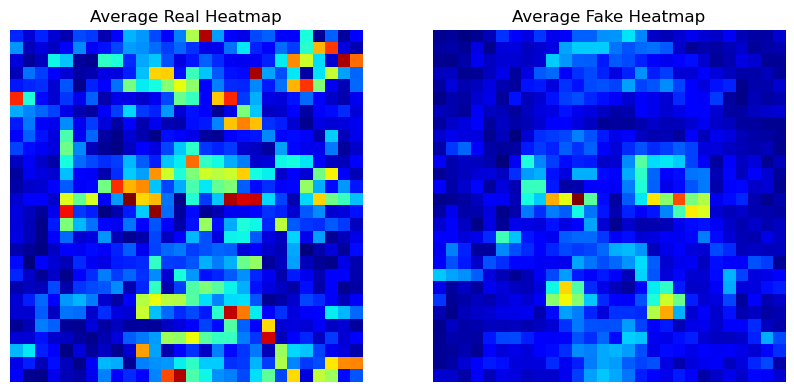

In [157]:
model = load_model("model_with_fake")
show_feature_differences(model, test_df,
                         last_conv_layer_name='conv2d_8',
                         n_pairs=10)

In [158]:
n = 5000
real_sample = test_df[test_df['label'] == '1'].sample(n)['path'].values
fake_sample = test_df[test_df['label'] == '0'].sample(n)['path'].values
all_paths = np.concatenate([real_sample, fake_sample])

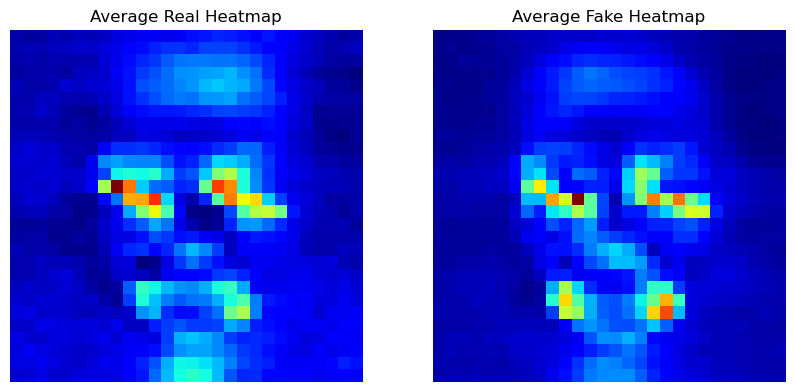

In [159]:
real_heatmap_avg = average_heatmap(real_sample, model,
                                   last_conv_layer='conv2d_8')
fake_heatmap_avg = average_heatmap(fake_sample, model,
                                   last_conv_layer='conv2d_8')

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.title("Average Real Heatmap"); \
    plt.imshow(real_heatmap_avg, cmap='jet'); plt.axis('off')
plt.subplot(1,2,2); plt.title("Average Fake Heatmap"); \
    plt.imshow(fake_heatmap_avg, cmap='jet'); plt.axis('off')
plt.show()

1/1 [==============================] - 0s 83ms/step


2024-12-10 08:18:54.758945: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2024-12-10 08:18:54.859595: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


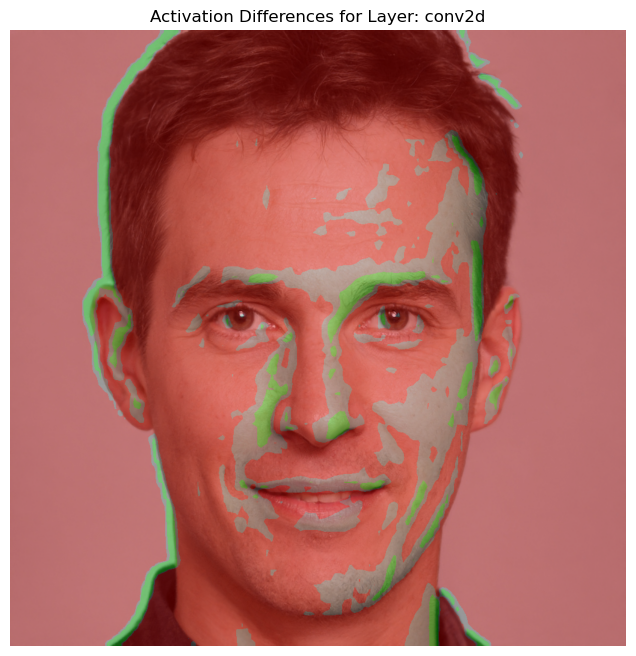

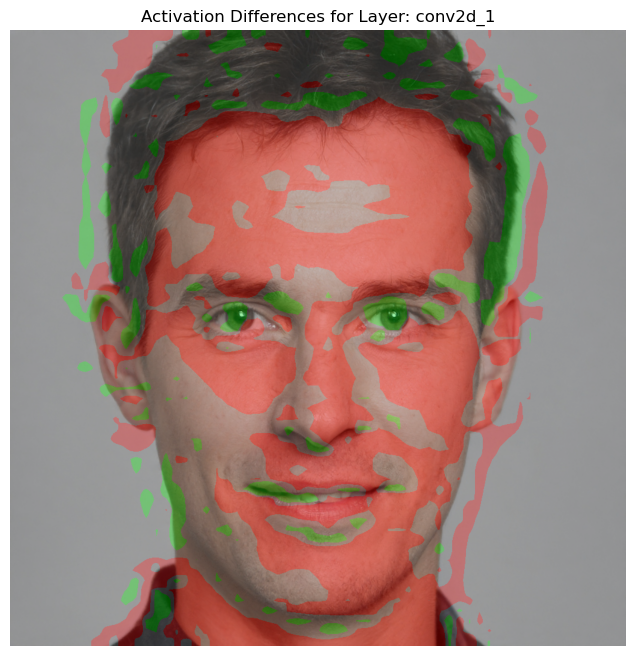

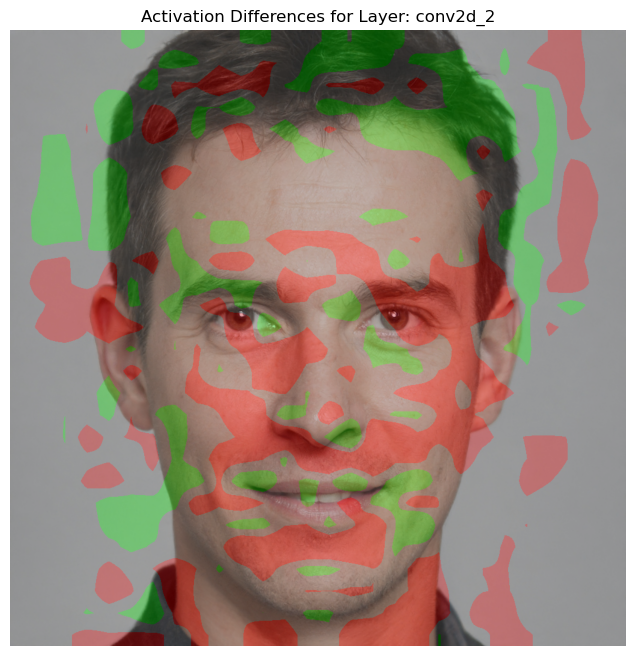

In [144]:
model_1_path = 'model_without_fake'
model_2_path = 'model_with_fake'
sample_image_path = 'ThisPersonDoesNotExist/Male/20220901_192026_90df7c4163414ea4ac4395cc44cba16f.png'

def get_layer_names(model):
    names = []
    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            names.append(layer.name)
    return names

def create_activation(model, layer_names):
    layer_outputs = [model.get_layer(name).output for name in layer_names]
    activation = Model(inputs=model.input, outputs=layer_outputs)
    return activation

def compute_difference(activation_1, activation_2):
    diff = activation_1 - activation_2
    diff_map = np.mean(diff, axis=-1)
    diff_map -= diff_map.min()
    diff_map /= (diff_map.max() + 1e-8)
    return diff_map

def visualize_difference(diff_map, original_img, layer_name, epsilon):
    diff_map_scaled = cv2.resize(diff_map, (original_img.shape[1],
                                            original_img.shape[0]))
    array = np.zeros_like(original_img, dtype=np.uint8)

    # red - model_1, green - model_2, grey - similar in both
    red = diff_map_scaled > (0.5 + epsilon)
    green = diff_map_scaled < (0.5 - epsilon)
    grey = (diff_map_scaled >= (0.5 - epsilon)) & \
        (diff_map_scaled <= (0.5 + epsilon))
    
    array[red] = [255, 0, 0]
    array[green] = [0, 255, 0]
    array[grey] = [128, 128, 128]
    
    colored = red | green | grey
    blended = original_img.copy()
    blended[colored] = cv2.addWeighted(original_img,
                                       0.7, array, 0.3, 0)[colored]
    plt.figure(figsize=(10, 8))
    plt.title(f'Activation Differences for Layer: {layer_name}')
    plt.imshow(blended)
    plt.axis('off')
    plt.show()

model_1 = load_model(model_1_path)
model_2 = load_model(model_2_path)

x = preprocess_image(sample_image_path, target_size=IMAGE_SIZE)
original_img = cv2.imread(sample_image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
layer_names_1 = get_layer_names(model_1)
layer_names_2 = get_layer_names(model_2)

activation_model_1 = create_activation(model_1, layer_names_1)
activation_model_2 = create_activation(model_2, layer_names_2)
activations_1 = activation_model_1.predict(x)
activations_2 = activation_model_2.predict(x)

for index, (layer_name_1, layer_name_2) in enumerate(zip(layer_names_1,
                                                         layer_names_2)):
    activation1 = activations_1[index][0]
    activation2 = activations_2[index][0]
    diff_map = compute_difference(activation1, activation2)
    visualize_difference(diff_map, original_img, layer_name_1, epsilon=0.05)
